# Predicting the life expectancy of different countries
**The project tries to create a model based on data provided by the World Health Organization (WHO) to evaluate the life expectancy for different countries in years. 
The data offers a timeframe from 2000 to 2015. The data originates from here: https://www.kaggle.com/kumarajarshi/life-expectancy-who/data. The output algorithms have been used to test if they can maintain their accuracy in predicting the life expectancy for data they haven’t been trained.**

# 1.Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# 2.Reading the data
**The data is saved as a csv file as LifeExpectancy.csv and it is read and stored in the dataset variable.The Year column is dropped as it will not be used in the analysis. Below the first 5 rows are shown. The data contains 21 columns and 2938 rows with the header row. The table contains data about:**

1. Country
1. Status
1. Life Expectancy
1. Adult Mortality
1. Alcohol
1. percentage expenditure
1. Hepatitis B
1. Measles
1. BMI
1. under-five deaths
1. Polio
1. Total expenditure
1. Diphtheria
1. HIV/AIDS
1. GDP
1. Population
1. thinness 1-19 years
1. thinness 5-9 years
1. Income composition of resources
1. Schooling

**With the exclution of Country name and Status(either developed or developing) all of the data is numeric. The values are either in years, precentages, millions or dollars in the case of Gross Domestic Product (GDP)**

In [2]:
!pip install dataprep

     |████████████████████████████████| 193 kB 404 kB/s 
     |████████████████████████████████| 10.1 MB 3.8 MB/s 
     |████████████████████████████████| 1.5 MB 5.5 MB/s 
     |████████████████████████████████| 719 kB 5.5 MB/s 
     |████████████████████████████████| 848 kB 5.6 MB/s 
     |████████████████████████████████| 88 kB 3.0 MB/s 
  Installing build dependencies ... - \ | / - \ | / - done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... - done
     |████████████████████████████████| 49 kB 2.7 MB/s 
  Created wheel for bottleneck: filename=Bottleneck-1.3.2-cp37-cp37m-linux_x86_64.whl size=334922 sha256=5e69cfdf2841eb0a4fb1306d24034d8b84eee7424f6255e411975eafa608c9f7
  Stored in directory: /root/.cache/pip/wheels/87/85/9c/a325c89ff0498660ef8a335fb4b3912939c273ea4f094af29f
Successfully built bottleneck
  Attempting uninstall: regex
    Found existing installation: regex 2021.3.17
    Uninstalling regex-2021.3.17:
      Successful

In [3]:
dataset = pd.read_csv('../input/life-expectancy-who/Life Expectancy Data.csv')
dataset.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [5]:
dataset.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


<AxesSubplot:xlabel='Status', ylabel='count'>

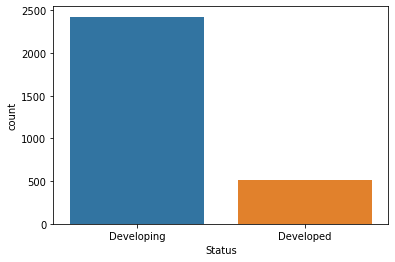

In [6]:
sns.countplot(x='Status',data=dataset)

/opt/conda/lib/python3.7/site-packages/dask/dataframe/accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)
/opt/conda/lib/python3.7/site-packages/dask/dataframe/accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)


  0%|          | 0/3479 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/dask/dataframe/accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)


My Report
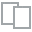
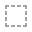
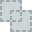
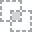
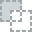
...
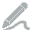
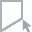
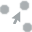
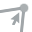
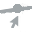

In [7]:
from dataprep.eda import create_report
report = create_report(dataset, title='My Report')
report

# 3.Data Cleaning & Preprocessing the Data

Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

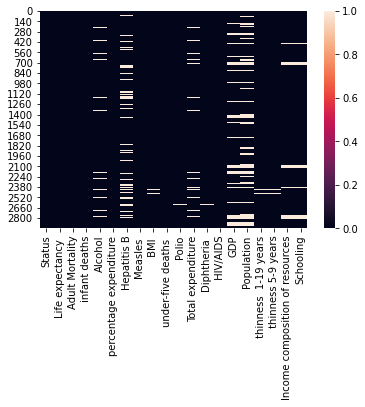

In [8]:
dataset = dataset.drop(['Year','Country'],axis=1)

dataset.head()
sns.heatmap(pd.isnull(dataset))
dataset.isnull().sum()

In [9]:
dataset['Life expectancy ']=dataset['Life expectancy '].fillna(value=dataset['Life expectancy '].mean())
dataset['Adult Mortality']=dataset['Adult Mortality'].fillna(value=dataset['Adult Mortality'].mean())
corr_data=dataset.corr()
corr_data


,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Life expectancy,1.000000,-0.696359,-0.196535,0.404029,0.381791,0.255760,-0.157574,0.564466,-0.222503,0.464531,0.216373,0.478465,-0.556457,0.461393,-0.021548,-0.476561,-0.470977,0.724631,0.748263
Adult Mortality,-0.696359,1.000000,0.078747,-0.195454,-0.242814,-0.161828,0.031174,-0.384806,0.094135,-0.274218,-0.114355,-0.274540,0.523727,-0.296019,-0.013639,0.302501,0.308053,-0.457530,-0.452380
infant deaths,-0.196535,0.078747,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,0.404029,-0.195454,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.381791,-0.242814,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.255760,-0.161828,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.157574,0.031174,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.564466,-0.384806,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.222503,0.094135,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373
Polio,0.464531,-0.274218,-0.170689,0.221734,0.147259,0.486171,-0.136166,0.284569,-0.188720,1.000000,0.137330,0.673553,-0.159560,0.211976,-0.038540,-0.221823,-0.222592,0.381078,0.417866


<AxesSubplot:>

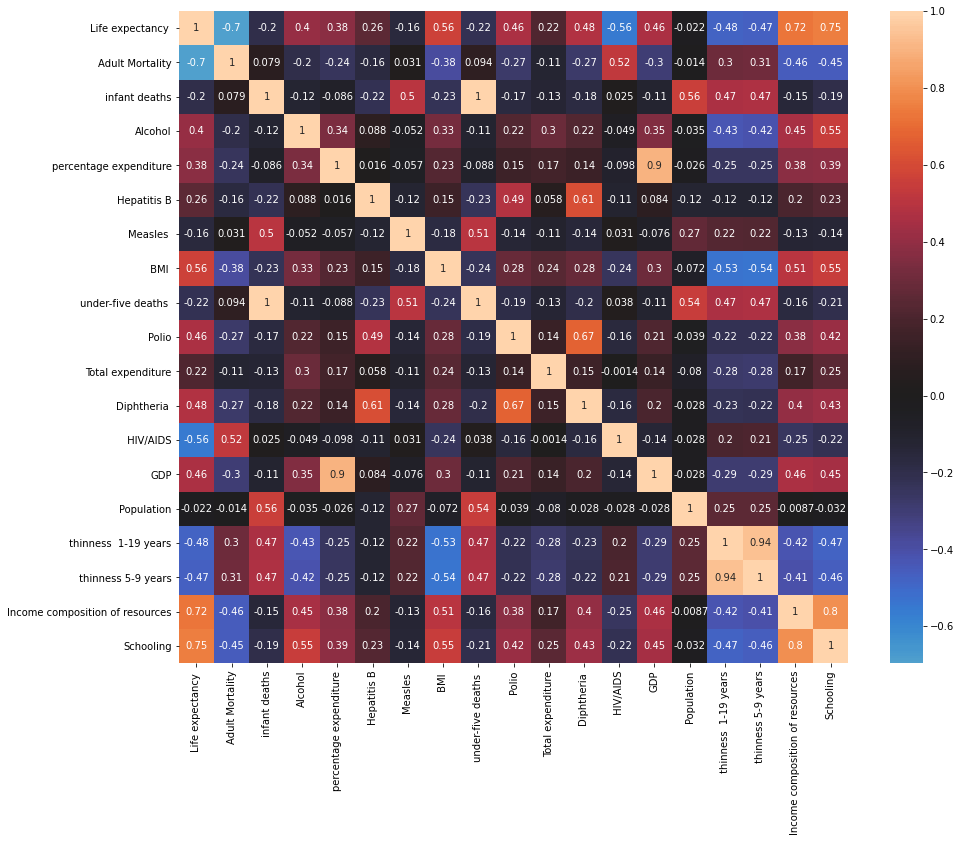

In [10]:
plt.figure(figsize=(15, 12))
sns.heatmap(dataset.corr(),center=0,annot=True)

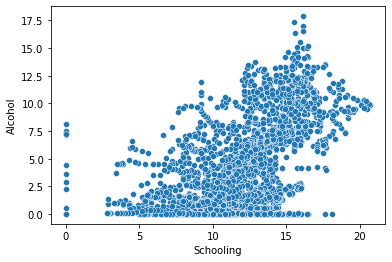

In [11]:
sns.scatterplot(x=dataset['Schooling'],y=dataset['Alcohol'])
def impute_Alcohol(cols):
    al=cols[0]
    sc=cols[1]
    if pd.isnull(al):
        if sc<=2.5:
            return 4.0
        elif 2.5<sc<=5.0:
            return 1.5
        elif 5.0<sc<=7.5:
            return 2.5
        elif 7.5<sc<=10.0:
            return 3.0
        elif 10.0<sc<=15:
            return 4.0
        elif sc>15:
            return 10.0
    else:
        return al
    
dataset['Alcohol']=dataset[['Alcohol','Schooling']].apply(impute_Alcohol,axis=1)

<AxesSubplot:>

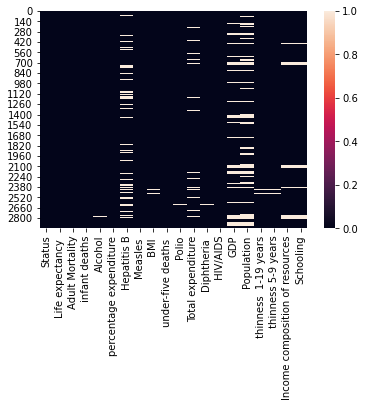

In [12]:
sns.heatmap(pd.isnull(dataset))

In [13]:
dataset['Alcohol']=dataset['Alcohol'].fillna(value=dataset['Alcohol'].mean())

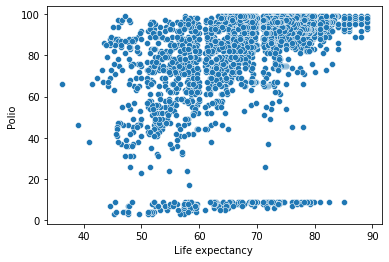

In [14]:
sns.scatterplot(x=dataset['Life expectancy '],y=dataset['Polio']);

In [15]:
def impute_polio(c):
    p=c[0]
    l=c[1]
    if pd.isnull(p):
        if l<=45:
            return 80.0
        elif 45<l<=50:
            return 67.0
        elif 50<l<=60:
            return 87.44
        elif 60<l<=70:
            return 91
        elif 70<l<=80:
            return 94.3
        elif l>80:
            return 95
    else:
        return p
    
dataset['Polio']=dataset[['Polio','Life expectancy ']].apply(impute_polio,axis=1)

<AxesSubplot:xlabel='Polio', ylabel='Diphtheria '>

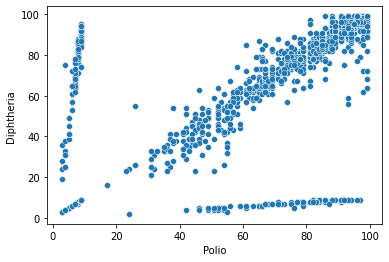

In [16]:
sns.scatterplot(x=dataset['Polio'],y=dataset['Diphtheria '])

In [17]:
def impute_Diptheria(c):
    d=c[0]
    p=c[1]
    if pd.isnull(d):
        if p<=10:
            return 75.0
        elif 10<p<=40:
            return 37.0
        elif 40<p<=45:
            return 40.0
        elif 45<p<=50:
            return 50.0
        elif 50<p<=60:
            return 55.0
        elif 60<p<=80:
            return 65.0
        elif p>80:
            return 90.0
    else:
        return d
dataset['Diphtheria ']=dataset[['Diphtheria ','Polio']].apply(impute_Diptheria,axis=1)

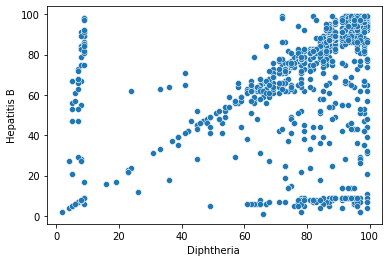

In [18]:
sns.scatterplot(x=dataset['Diphtheria '],y=dataset['Hepatitis B']);

In [19]:
def impute_HepatatisB(cols):
    hep=cols[0]
    dip=cols[1]
    if pd.isnull(hep):
        if dip<=15:
            return 75.0
        elif 15<dip<=30:
            return 20.0
        elif 30<dip<=45:
            return 38.0
        elif 45<dip<=60:
            return 43.0
        elif 60<dip<=80:
            return 63.0
        elif dip>80:
            return 88.4
    else:
        return hep
    
dataset['Hepatitis B']=dataset[['Hepatitis B','Diphtheria ']].apply(impute_HepatatisB,axis=1)

In [20]:
dataset[dataset['Diphtheria ']>80.0]['Hepatitis B'].mean()

88.39573481687529

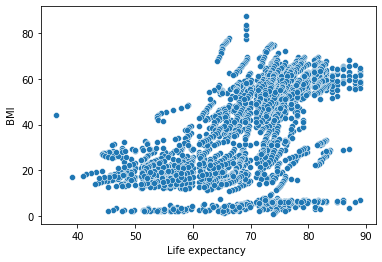

In [21]:
sns.scatterplot(x=dataset['Life expectancy '],y=dataset[' BMI ']);

In [22]:
def impute_BMI(c):
    b=c[0]
    l=c[1]
    if pd.isnull(b):
        if l<=50:
            return 25.0
        elif 50<l<=60:
            return 25.0
        elif 60<l<=70:
            return 32.0
        elif 70<l<=80:
            return 46.8
        elif 80<l<=100:
            return 60.0
    else:
        return b
    
dataset[' BMI ']=dataset[[' BMI ','Life expectancy ']].apply(impute_BMI,axis=1)

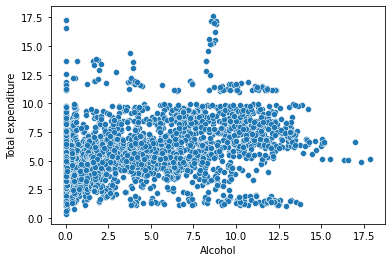

In [23]:
sns.scatterplot(y=dataset['Total expenditure'],x=dataset['Alcohol']);

In [24]:
def impute_Total_exp(c):
    t=c[0]
    a=c[1]
    if pd.isnull(t):
        if a<=2.5:
            return 5.08
        elif 2.5<a<=5.0:
            return 6.0
        elif 5.0<a<=10.0:
            return 6.71
        elif 10.0<a<=12.5:
            return 6.9
        elif a>12.5:
            return 6.68
    else:
        return t
    
dataset['Total expenditure']=dataset[['Total expenditure','Alcohol']].apply(impute_Total_exp,axis=1)

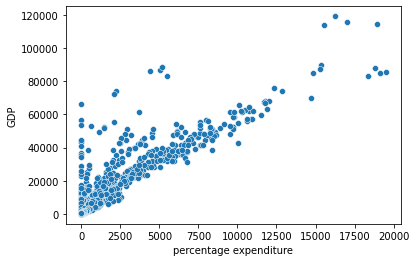

In [25]:
sns.scatterplot(x=dataset['percentage expenditure'],y=dataset['GDP']);

In [26]:
def impute_GDP(c):
    g=c[0]
    p=c[1]
    if pd.isnull(g):
        if p<=1250:
            return 1100.0
        elif 1250<p<=2500:
            return 1800.0
        elif 2500<p<=3750:
            return 2900.0
        elif 3750<p<=7500:
            return 3500.0
        elif 7500<p<=8750:
            return 4500.0
        elif 8750<p<=10000:
            return 5000.0
        elif 10000<p<=11250:
            return 5700.0
        elif 11250<p<=12500:
            return 7000.0
        elif 12500<p<=15000:
            return 8000.0
        elif 15000<p<=17500:
            return 9000.0
        elif p>17500:
            return 8500.0
    else:
        return g

dataset['GDP']=dataset[['GDP','percentage expenditure']].apply(impute_GDP,axis=1)

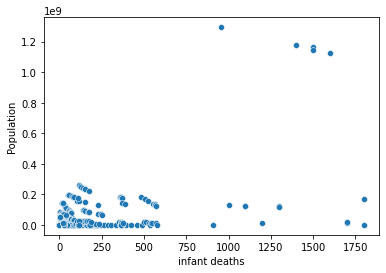

In [27]:

sns.scatterplot(x=dataset['infant deaths'],y=dataset['Population']);

In [28]:
def impute_population(c):
    p=c[0]
    i=c[1]
    if pd.isnull(p):
        if i<=100:
            return 0.19*((10)**9)
        elif 100<i<=250:
            return 0.18*((10)**9)
        elif 250<i<=350:
            return 0.02*((10)**9)
        elif 350<i<=900:
            return 0.1*((10)**9)
        elif 900<i<=1100:
            return 0.18*((10)**9)
        elif 1100<i<=1250:
            return 0.05*((10)**9)
        elif 1250<i<=1500:
            return 0.19*((10)**9)
        elif 1500<i<=1750:
            return 0.05*((10)**9)
        elif i>1750:
            return 0.1*((10)**9)
    else:
        return p
    
dataset['Population']=dataset[['Population','infant deaths']].apply(impute_population,axis=1)

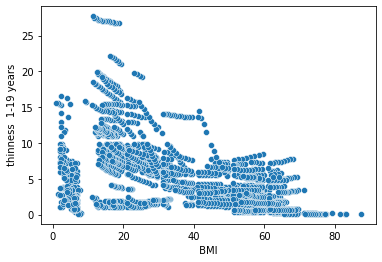

In [29]:
sns.scatterplot(x=dataset[' BMI '],y=dataset[' thinness  1-19 years']);

In [30]:
def impute_Thin_1(c):
    t=c[0]
    b=c[1]
    if pd.isnull(t):
        if b<=10:
            return 5.0
        elif 10<b<=20:
            return 10.0
        elif 20<b<=30:
            return 8.0
        elif 30<b<=40:
            return 6.0
        elif 40<b<=50:
            return 3.0
        elif 50<b<=70:
            return 4.0
        elif b>70:
            return 1.0
    else:
        return t
    
dataset[' thinness  1-19 years']=dataset[[' thinness  1-19 years',' BMI ']].apply(impute_Thin_1,axis=1)

<AxesSubplot:xlabel=' BMI ', ylabel=' thinness 5-9 years'>

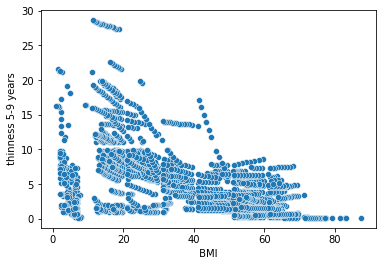

In [31]:
sns.scatterplot(x=dataset[' BMI '],y=dataset[' thinness 5-9 years'])

In [32]:
def impute_Thin_1(c):
    t=c[0]
    b=c[1]
    if pd.isnull(t):
        if b<=10:
            return 5.0
        elif 10<b<=20:
            return 10.0
        elif 20<b<=30:
            return 8.0
        elif 30<b<=40:
            return 6.0
        elif 40<b<=50:
            return 3.0
        elif 50<b<=70:
            return 4.0
        elif b>70:
            return 1.0
    else:
        return t
    
dataset[' thinness 5-9 years']=dataset[[' thinness 5-9 years',' BMI ']].apply(impute_Thin_1,axis=1)

<AxesSubplot:xlabel='Life expectancy ', ylabel='Income composition of resources'>

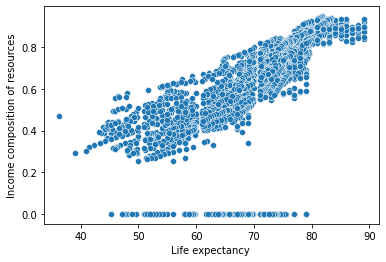

In [33]:
sns.scatterplot(x=dataset['Life expectancy '],y=dataset['Income composition of resources'])

In [34]:
def impute_Income(c):
    i=c[0]
    l=c[1]
    if pd.isnull(i):
        if l<=40:
            return 0.4
        elif 40<l<=50:
            return 0.42
        elif 50<l<=60:
            return 0.402
        elif 60<l<=70:
            return 0.54
        elif 70<l<=80:
            return 0.71
        elif l>80:
            return 0.88
    else:
        return i
        
dataset['Income composition of resources']=dataset[['Income composition of resources','Life expectancy ']].apply(impute_Income,axis=1)

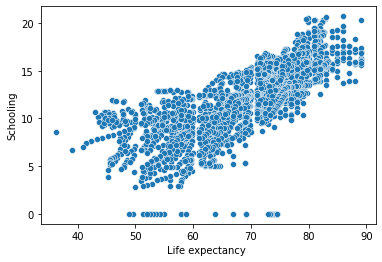

In [35]:
sns.scatterplot(x=dataset['Life expectancy '],y=dataset['Schooling']);

In [36]:
def impute_schooling(c):
    s=c[0]
    l=c[1]
    if pd.isnull(s):
        if l<= 40:
            return 8.0
        elif 40<l<=44:
            return 7.5
        elif 44<l<50:
            return 8.1
        elif 50<l<=60:
            return 8.2
        elif 60<l<=70:
            return 10.5
        elif 70<l<=80:
            return 13.4
        elif l>80:
            return 16.5
    else:
        return s
    
dataset['Schooling']=dataset[['Schooling','Life expectancy ']].apply(impute_schooling,axis=1)

In [37]:
dataset[(dataset['Life expectancy ']>80) & (dataset['Life expectancy ']<=90)]['Schooling'].mean()

16.509881422924902

## Clean dataset with no null values

In [38]:
a=list(dataset.columns)
b=[]
for i in a:
    c=dataset[i].isnull().sum()
    b.append(c)
null_df=pd.DataFrame({'Feature name':a,'no. of Nan':b})
null_df

,Feature name,no. of Nan
0,Status,0
1,Life expectancy,0
2,Adult Mortality,0
3,infant deaths,0
4,Alcohol,0
5,percentage expenditure,0
6,Hepatitis B,0
7,Measles,0
8,BMI,0
9,under-five deaths,0


In [39]:
#Creating 2 dummy variables to deal with numerical value
y=dataset['Life expectancy ']
X=dataset.drop('Life expectancy ',axis=1)
X['Status'].unique()

array(['Developing', 'Developed'], dtype=object)

In [40]:
status_dummy=pd.get_dummies(X['Status'])
X.drop(['Status'],inplace=True,axis=1)

In [41]:
X=pd.concat([X,status_dummy],axis=1)
X.shape

(2938, 20)

# 4.Train/Test split

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=101)

## RandomForest Regression

In [43]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

In [44]:
# Predicting a new result
y_pred = regressor.predict(X_test)
np.set_printoptions(precision=2)
y_pred = np.array(y_pred)
y_test = np.array(y_test)

print(np.concatenate((y_pred.reshape(len(y_test),1), y_test.reshape(len(y_test),1)),1))

[[63.27 62.5 ]
 [54.59 53.6 ]
 [82.98 83.3 ]
 ...
 [54.98 55.  ]
 [69.92 69.4 ]
 [74.15 75.  ]]


In [45]:
accuracy_score =  regressor.score(X_test,y_test)
print(accuracy_score)

0.9648232295114401


In [46]:
print('Random Forest Classifier Accuracy:',(accuracy_score)*100,'%')

Random Forest Classifier Accuracy: 96.482322951144 %


In [47]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
print(mean_squared_error(y_test,y_pred)**(0.5))

1.7437636565747747


In [48]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(regressor,X_train,y_train,cv=10)
accuracies.mean()

0.9601520673266644